In [26]:
# packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import calplot as cp
import plotly.express as px
import os
from pathlib import Path
from bokeh.io import show, output_notebook
from bokeh.models import ColumnDataSource, Select, CustomJS, HoverTool, Span, Div, BoxZoomTool, ResetTool
from bokeh.plotting import figure
from bokeh.layouts import column, row
output_notebook()  # Enables Bokeh to render inline in Jupyter


Loading BokehJS ...

In [3]:
pd.options.mode.copy_on_write = True

In [4]:
# relevant columns
cols_to_keep = [
    'family',
    'genus',
    'species',
    'locality',
    #'coordinateUncertaintyInMeters',
    'decimalLatitude',
    'decimalLongitude',
    'eventDate',
    'month',
    'year'
]
# only keep the species that are part of the Novama program
species_to_keep = set([
    "Ichthyaetus melanocephalus",
    "Ciconia ciconia",
    "Ciconia nigra",
    "Circus pygargus",
    "Pandion haliaetus",
    "Aquila chrysaetos",
    "Haliaeetus albicilla",
    "Aegolius funereus",
    "Asio flammeus",
    "Falco peregrinus",
    "Anthus campestris"
])

# used for mapping species to commonname
species_to_commonname = {
    'Aegolius funereus': 'Boreal owl',
    'Anthus campestris': 'Tawny pipit',
    'Asio flammeus': 'Short-eared owl',
    'Aquila chrysaetos': 'Golden eagle',
    'Ciconia ciconia': 'White stork',
    'Ciconia nigra': 'Black stork',
    'Circus pygargus': "Montagu's harrier",
    'Falco peregrinus': 'Peregrine falcon',
    'Haliaeetus albicilla': 'White-tailed eagle',
    'Ichthyaetus melanocephalus': 'Mediterranean gull',
    'Pandion haliaetus': 'Osprey',
}


# Specify the correct delimiter and handle bad lines (tab separated file)
df = pd.read_csv('./resources/DOF-observations-threathened-and-rare-species-1998-2025.csv', usecols=cols_to_keep, sep='\t', on_bad_lines='skip')
# remove 2025, as the year is not completed yet
df = df[df['year'] != 2025]

df_novama = df[df["species"].isin(species_to_keep)]

# add a new column commonName with the english commonName of the birds
# fillna handles unknown species, if there are any
df_novama['commonName'] = df_novama['species'].map(species_to_commonname).fillna('Unknown species')
df_novama.head()


,family,genus,species,locality,decimalLatitude,decimalLongitude,eventDate,month,year,commonName
1,Pandionidae,Pandion,Pandion haliaetus,Skærsø Plantage,56.23806,10.68577,2001-06-13,6,2001,Osprey
10,Accipitridae,Circus,Circus pygargus,Egebæk,55.28405,8.72183,2003-06-24,6,2003,Montagu's harrier
18,Accipitridae,Haliaeetus,Haliaeetus albicilla,Holmegårds Mose EF-lok. 91,55.29329,11.82678,2002-08-18,8,2002,White-tailed eagle
24,Falconidae,Falco,Falco peregrinus,"Klydesøen, Kalvebod Fælled",55.58507,12.52259,2002-09-09,9,2002,Peregrine falcon
40,Falconidae,Falco,Falco peregrinus,Nørrestrand,55.87815,9.87592,2002-12-17,12,2002,Peregrine falcon


# Inspecting how the different families are doing

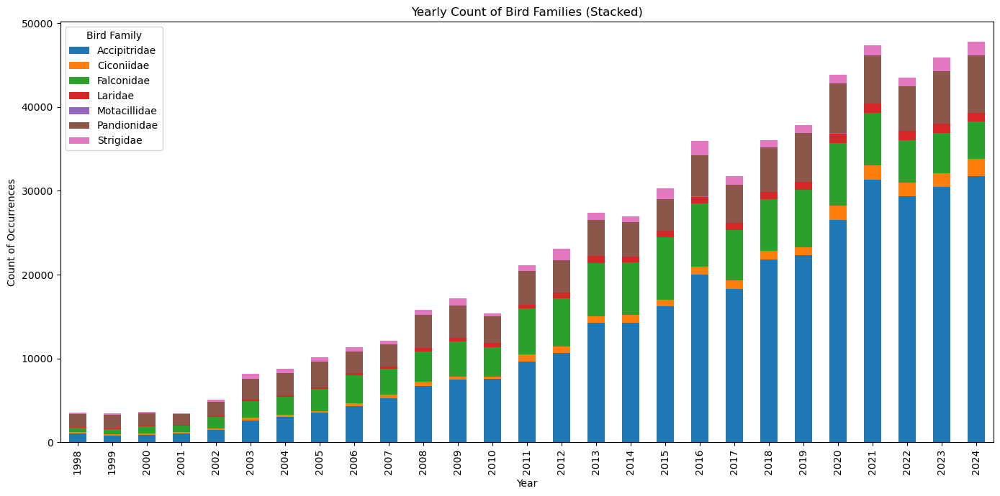

In [5]:
df_families = df_novama.groupby(['family', 'year']).size().unstack()
# filling NAs with 0
df_families = df_families.fillna(0)
# transposing so year is index for better plotting
df_transposed = df_families.T

# Plotting the stacked bar plot
df_transposed.plot(kind='bar', stacked=True, figsize=(14,7))

# Adding labels and title
plt.xlabel('Year')  # X-axis label
plt.ylabel('Count of Occurrences')  # Y-axis label
plt.title('Yearly Count of Bird Families (Stacked)')  # Plot title
plt.legend(title='Bird Family')  # Legend title
plt.tight_layout()  # Adjust layout to avoid clipping

# Show the plot
plt.show()

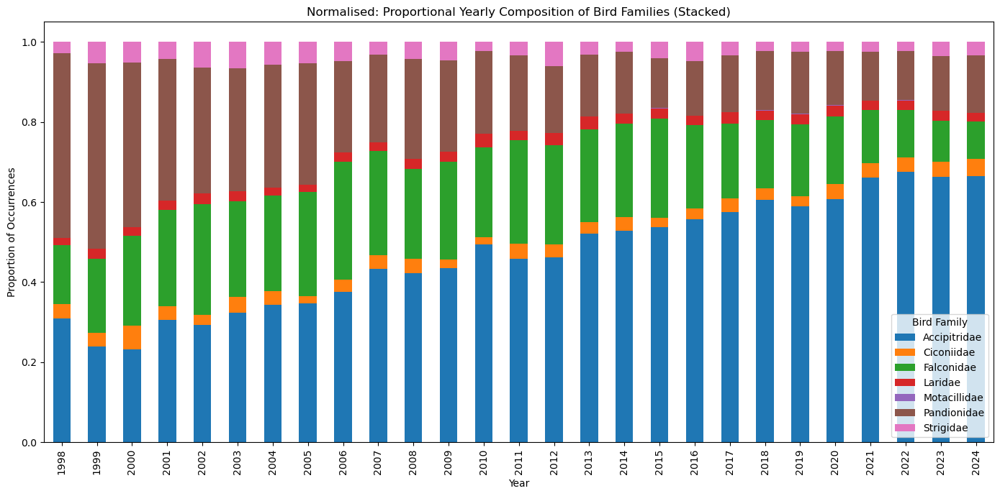

In [6]:
# Normalizing the data so each year's total is 1 (or 100%)
df_normalized = df_transposed.div(df_transposed.sum(axis=1), axis=0)

# Plotting the normalized stacked bar plot
df_normalized.plot(kind='bar', stacked=True, figsize=(14,7))

# Adding labels and title
plt.xlabel('Year')  # X-axis label
plt.ylabel('Proportion of Occurrences')  # Y-axis label (since now it's proportion)
plt.title('Normalised: Proportional Yearly Composition of Bird Families (Stacked)')  # Plot title
plt.legend(title='Bird Family')  # Legend title
plt.tight_layout()  # Adjust layout

# Show the plot
plt.show()

# Overall development over time - grouped by species

In [ ]:
df_yearly = df_novama.groupby(['year', 'commonName']).size().unstack()

# Reshape data to long format
df_long = df_yearly.reset_index().melt(id_vars="year", var_name="commonName", value_name="count")
df_long = df_long.fillna(0.0)

source = ColumnDataSource(df_long)


,year,commonName,count
0,1998,Black stork,2.0
1,1999,Black stork,8.0
2,2000,Black stork,5.0
3,2001,Black stork,5.0
4,2002,Black stork,4.0
5,2003,Black stork,11.0
6,2004,Black stork,27.0
7,2005,Black stork,NaN
8,2006,Black stork,4.0
9,2007,Black stork,6.0


In [14]:
# Define the image directory - adjust this path to where your bird images are stored
IMAGE_DIR = "bird_images/"  # Change this to your actual directory path

# function used to customize the bokeh plot
def customize_bokeh(p):
    p.toolbar.autohide = True
    p.toolbar.logo = None

    p.title.text_font_size = "25px"
    p.title.align = "center"

    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None

    p.xaxis.ticker = list(range(1998, 2025))
    p.xaxis.major_label_orientation = 1.2
    p.axis.minor_tick_in = -3
    p.axis.minor_tick_out = 6

# Function to check if an image exists for a given species
def image_exists(species_name):
    """Check if an image file exists for the given species name"""
    image_filename = species_name.replace(" ", "_").lower() + ".png"  # Adjust extension if needed
    image_path = Path(IMAGE_DIR) / image_filename
    return image_path.exists()

# Create a function to generate HTML for displaying the bird image
def get_bird_image_html(species_name):
    """Generate HTML for displaying a bird image with proper error handling"""
    # Clean species name for file path (replace spaces with underscores, etc.)
    image_filename = species_name.replace(" ", "_").lower() + ".png"  # Adjust extension if needed
    image_path = os.path.join(IMAGE_DIR, image_filename)
    
    # Create HTML with error handling using onerror attribute
    # This ensures a placeholder is shown if the image fails to load
    html = f"""
    <div style="width:300px; height:300px; overflow:hidden; border-radius:5px; margin-bottom:10px;">
        <img 
            src="{image_path}" 
            alt="{species_name}" 
            style="width:100%; height:100%; object-fit:cover;"
            onerror="this.onerror=null; this.src='data:image/svg+xml;utf8,<svg xmlns=\\'http://www.w3.org/2000/svg\\' width=\\'200\\' height=\\'150\\'><rect width=\\'100%\\' height=\\'100%\\' fill=\\'%23f5f5f5\\'/><text x=\\'50%\\' y=\\'50%\\' font-family=\\'Arial\\' font-size=\\'14\\' text-anchor=\\'middle\\' dominant-baseline=\\'middle\\'>No Image Available</text></svg>';"
        >
    </div>
    <div style="font-weight:bold; text-align:center; margin-bottom:5px;">{species_name}</div>
    """
    return html


In [23]:

# Create a complete range of years
all_years = list(range(1998, 2025))  # 1998 to 2024 inclusive

# Get unique species list
species_list = sorted(df_long['commonName'].unique().tolist())

# Create the data source with all the data
all_data_source = ColumnDataSource(df_long)

# Initialize with the first species
initial_species = species_list[0]
filtered_df = df_long[df_long['commonName'] == initial_species]
filtered_source = ColumnDataSource(filtered_df)

# Create a figure for the bar chart with fixed x_range
p = figure(
    height=400, 
    width=800, 
    title=f"{initial_species}",
    x_axis_label='Year', 
    y_axis_label='Observations',
    toolbar_location="below", 
    tools=[HoverTool(), BoxZoomTool(), ResetTool()],
    tooltips="@year: @count observations",
    x_range=(1997, 2025)  # Set fixed x-range with all years
)

# Add bars to the figure
bars = p.vbar(
    x='year', 
    top='count', 
    width=0.9, 
    source=filtered_source,
    color="skyblue",
    line_color="darkblue"
)

# Add a light horizontal line at y=0 to make it clear where zero is
zero_line = Span(
    location=0,
    dimension='width',
    line_color='lightgray',
    line_width=1.5,
    line_dash='dashed'
)

p.renderers.extend([zero_line])

# Customize the appearance (assuming this function exists in your code)
customize_bokeh(p)

# Create a Div to display the bird image
bird_image_div = Div(
    text=get_bird_image_html(initial_species),
    width=250,
    height=220
)

# Create the Select widget
species_select = Select(
    title="Select Species",
    value=initial_species,
    options=species_list,
    width=250
)

# Define a JavaScript callback for species selection
callback = CustomJS(args=dict(
    all_source=all_data_source, 
    filtered_source=filtered_source, 
    species_select=species_select,
    plot=p,
    bird_div=bird_image_div,
    image_dir=IMAGE_DIR), code="""
    // Get the selected species
    const species = species_select.value;
    
    // Get the data from the all_source
    const data = all_source.data;
    const years = data['year'];
    const counts = data['count'];
    const names = data['commonName'];
    
    // Filter the data for the selected species
    const filtered_years = [];
    const filtered_counts = [];
    const filtered_names = [];
    
    for (let i = 0; i < names.length; i++) {
        if (names[i] === species) {
            filtered_years.push(years[i]);
            filtered_counts.push(counts[i]);
            filtered_names.push(names[i]);
        }
    }
    
    // Update the filtered source with new data
    filtered_source.data = {
        'year': filtered_years,
        'count': filtered_counts,
        'commonName': filtered_names
    };
    
    // Update plot title
    plot.title.text = species;
    
    // Update bird image
    const image_filename = species.replace(/ /g, "_").toLowerCase() + ".png";
    const image_path = image_dir + image_filename;
    
    // Create HTML for the bird image with improved error handling
    const html = `
        <div style="overflow:hidden; border-radius:5px; margin-bottom:10px; position:relative;">
            <img 
                src="${image_path}" 
                alt="${species}" 
                style="width:100%; height:100%; object-fit:cover;"
                onerror="this.onerror=null; this.style.display='none'; this.parentNode.innerHTML += '<div style=\\'position:absolute; top:0; left:0; width:100%; height:100%; display:flex; align-items:center; justify-content:center; font-family:Arial; font-size:14px; color:#666;\\'>No image available</div>';"
            >
        </div>
        <div style="font-weight:bold; text-align:center; margin-bottom:5px;">${species}</div>
    `;
    
    bird_div.text = html;
    
    // This triggers a redraw
    filtered_source.change.emit();
""")

# Attach the callback to the Select widget
species_select.js_on_change('value', callback)

# Create a layout for plot and bird-image
l = row(
    column(p),
    bird_image_div,
    spacing=20,  # Add space between dropdown and image
)

# Then create the final layout with plot below
final_layout = column(
    species_select,
    l,
    sizing_mode="fixed",
    width=850,
    height=500,
    margin=(20,20,20,20)  # Add some margin around everything
)

# Show the plot
output_notebook()  # Use this if you're in a Jupyter notebook
show(final_layout)

Loading BokehJS ...

# White-tailed eagle Geodata over time - Positive story

In [25]:
df_white_tailed_eagle = df_novama[df_novama['commonName'] == 'White-tailed eagle']
df_white_tailed_eagle = df_white_tailed_eagle.sort_values(by="year")

df_white_tailed_eagle = df_white_tailed_eagle.groupby(
    ["decimalLatitude", "decimalLongitude", "year", "locality"]
).size().reset_index(name="observation_count")

df_white_tailed_eagle = df_white_tailed_eagle.sort_values(by="year")


df_white_tailed_eagle.head()

,decimalLatitude,decimalLongitude,year,locality,observation_count
37341,55.51106,8.29922,1998,Skallingen/Langli total,12
25039,55.21837,9.66829,1998,Bankel Nor,20
80078,57.74305,10.60104,1998,"Batterivej, Skagen",3
1360,54.64488,11.94047,1998,Bøtø Nor ved Nørresø (reservatet ved tårnene),2
35488,55.46939,10.46321,1998,Vigelsø,5


In [28]:
# create the text for the hover element
df_white_tailed_eagle["hover_text"] = (
    "Year: " + df_white_tailed_eagle["year"].astype(str) +
    "<br>Observations: " + df_white_tailed_eagle["observation_count"].astype(str) +
    "<br>Location: " + df_white_tailed_eagle["locality"].astype(str)
)

In [31]:

# Create the animated scatter map
fig = px.scatter_map(
    df_white_tailed_eagle,
    lat="decimalLatitude",
    lon="decimalLongitude",
    size="observation_count",
    hover_name="hover_text",  # Use your custom string here
    hover_data={
        "year": False,
        "decimalLatitude": False,
        "decimalLongitude": False,
        "observation_count": False
    },
    color_discrete_sequence=["blue"],  # set point color
    animation_frame="year",  # animate by year
    zoom=6,  # suitable zoom for Denmark
    center={"lat": 56.0, "lon": 11.0},  # center map on Denmark
    height=800,  # figure height
    width=800
)

# Use an open-source Mapbox style (no access token needed)
fig.update_layout(
    map_style="carto-positron",
    title={
        "text": "White-tailed Eagle Sightings in Denmark (1998-2024)",
        "x": 0.5,  # Center the title
        "xanchor": "center"
    },
    margin={"r": 20, "t": 40, "l": 20, "b": 20},
)

# Show the interactive map
fig.show()